<a href="https://colab.research.google.com/github/AbrahamKong/CMPE258_Practice_transfer_learning_and_supervised_contrastive_learning/blob/main/Zero_shot_transfer_learning_in_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Goal

Showcase zero shot transfer learning with CLIP model 

Showcase transfer learning using state of art models from tfhub (Eg: use bigtransfer for example) using tfhub



# Zero Shot Learning with CLIP

This Colab notebook demos a smarter detector that generates bounding boxes using [selective search](http://cs.brown.edu/people/pfelzens/papers/seg-ijcv.pdf), then filters them out with NMS using CLIP's image-text similarity score.

## Install dependencies

In [1]:
!pip install ftfy regex tqdm matplotlib selectivesearch
!pip install git+https://github.com/openai/CLIP.git

     |████████████████████████████████| 53 kB 753 kB/s 
  Created wheel for selectivesearch: filename=selectivesearch-0.4-py3-none-any.whl size=4349 sha256=03787ba750a9e9b577c861bc6c09c99a04d0203ad2e44fa1f43c7edb77b62d33
  Stored in directory: /root/.cache/pip/wheels/83/0e/c9/4713ec9c1692e688f84fd3e80201018a02992949ca63697ba8
Successfully built selectivesearch
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-py5lpsqp
  Running command git clone -q https://github.com/openai/CLIP.git /tmp/pip-req-build-py5lpsqp
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369387 sha256=4c6b2d8845faedc8ff5f9934e002a1590f9bc415bdc2fca508f3e4192217b8e4
  Stored in directory: /tmp/pip-ephem-wheel-cache-9wqzrpuq/wheels/fd/b9/c3/5b4470e35ed76e174bff77c92f91da82098d5e35fd5bc8cdac
Successfully built clip


In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import urllib.request
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import clip
from PIL import Image
from torchvision import transforms
import selectivesearch
from collections import OrderedDict

## Helper functions

In [3]:
# helper functions for loading, patchifying and visualizing images.

def load_image(img_path, resize=None, pil=False):
    image = Image.open(image_path).convert("RGB")
    if resize is not None:
        image = image.resize((resize, resize))
    if pil:
        return image
    image = np.asarray(image).astype(np.float32) / 255. 
    return image

# Reference: https://github.com/rbgirshick/fast-rcnn/blob/master/lib/utils/nms.py
def nms(dets, thresh):
    x1 = dets[:, 0]
    y1 = dets[:, 1]
    x2 = dets[:, 2]
    y2 = dets[:, 3]
    scores = dets[:, 4]

    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    order = scores.argsort()[::-1]

    keep = []
    while order.size > 0:
        i = order[0]
        keep.append(i)
        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])

        w = np.maximum(0.0, xx2 - xx1 + 1)
        h = np.maximum(0.0, yy2 - yy1 + 1)
        inter = w * h
        ovr = inter / (areas[i] + areas[order[1:]] - inter)

        inds = np.where(ovr <= thresh)[0]
        order = order[inds + 1]

    return keep

# Reference: https://github.com/rbgirshick/py-faster-rcnn/blob/master/tools/demo.py
def vis_detections(im, dets, thresh=0.5, caption=None):
    """Draw detected bounding boxes."""
    inds = np.where(dets[:, -1] >= thresh)[0]
    if len(inds) == 0:
        return

    top_idx = dets[:, -1].argmax()

    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')
    for i in inds:
        bbox = dets[i, :4]
        score = dets[i, -1]

        ax.add_patch(
            plt.Rectangle((bbox[0], bbox[1]),
                          bbox[2] - bbox[0],
                          bbox[3] - bbox[1], fill=False,
                          edgecolor='red' if i == top_idx else 'green', linewidth=3.5)
            )
        ax.text(bbox[0], bbox[1] - 2,
                '{:.3f}'.format(score),
                bbox=dict(facecolor='blue', alpha=0.5),
                fontsize=14, color='white')
    plt.axis('off')
    plt.tight_layout()
    plt.draw()
    if caption is not None:
        plt.title(caption, fontsize=20)
    plt.show()

## Generate Bounding Boxes with Selective Search

Image resolution: (461, 660)
Generated 153 bounding boxes. Taking the top 50.


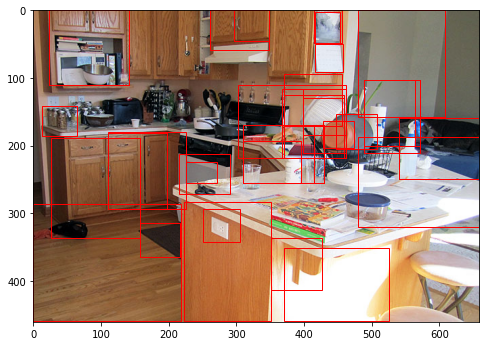

In [4]:
#If the cell takes too long to execute, it means the image size is too large.
#Use the resize parameter to reduce the image size, and rerun.

image_url = 'http://archive.jsonline.com/Services/image.ashx?domain=www.jsonline.com&file=30025294_messykitchen1.jpg&resize='
resize = None
topk = 50
scale =  200
sigma =  0.8
min_size = 50

# Download the image from the web.
image_path = 'image.png'
urllib.request.urlretrieve(image_url, image_path)

if resize is not None:
    assert isinstance(resize, int), "resize should be an integer."

img = load_image(image_path)
oh, ow = img.shape[:2]
print(f"Image resolution: {oh, ow}")

# Selective search.
img_search = load_image(image_path, resize=resize)
img_lbl, regions = selectivesearch.selective_search(
    img_search, scale=scale, sigma=sigma, min_size=min_size)
candidates = OrderedDict()
for i, r in enumerate(regions):
    if r['rect'] in candidates:
        continue
    if r['size'] < 1000:
        continue
    x, y, w, h = r['rect']
    if w / h > 1.5 or h / w > 1.5:
        continue
    if resize is not None:
        sx = (ow / resize)
        sy = (oh / resize)
        x_, y_, w_, h_ = r['rect']
        x = np.clip(x_ * sx, 0, ow).astype(int)
        y = np.clip(y_ * sy, 0, oh).astype(int)
        w = np.clip(w_ * sx, 0, ow).astype(int)
        h = np.clip(h_ * sy, 0, oh).astype(int)
        r['rect'] = (x, y, w, h)
    candidates[i] = r['rect']
candidates = list(candidates.values())
print(f"Generated {len(candidates)} bounding boxes. Taking the top {topk}.")
candidates = candidates[:topk]

# Display topk bounding boxes.
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(8, 8))
ax.imshow(img)
for x, y, w, h in candidates:
    rect = mpatches.Rectangle(
        (x, y), w, h, fill=False, edgecolor='red', linewidth=1)
    ax.add_patch(rect)
plt.show()

## Detect

Using device: cpu


100%|████████████████████████████████████████| 338M/338M [00:03<00:00, 114MiB/s]


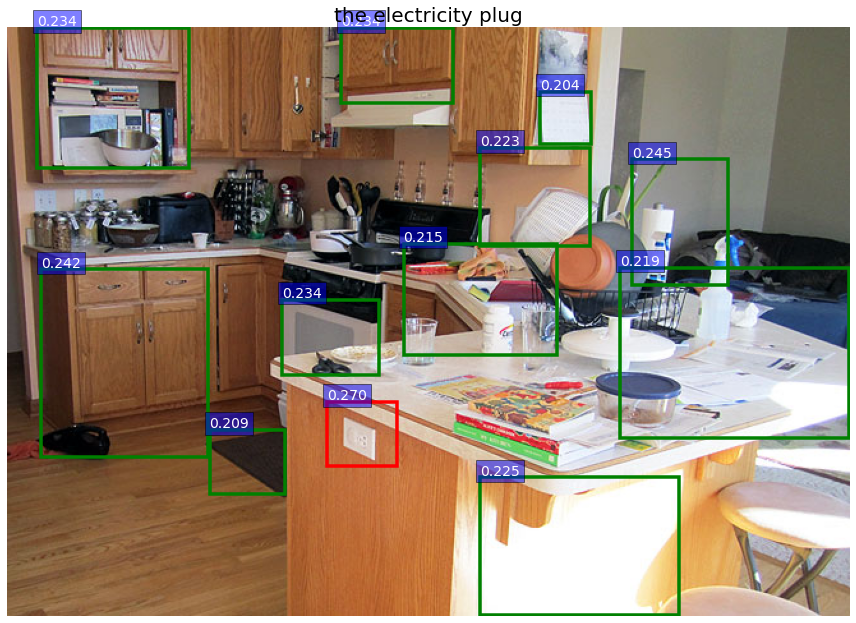

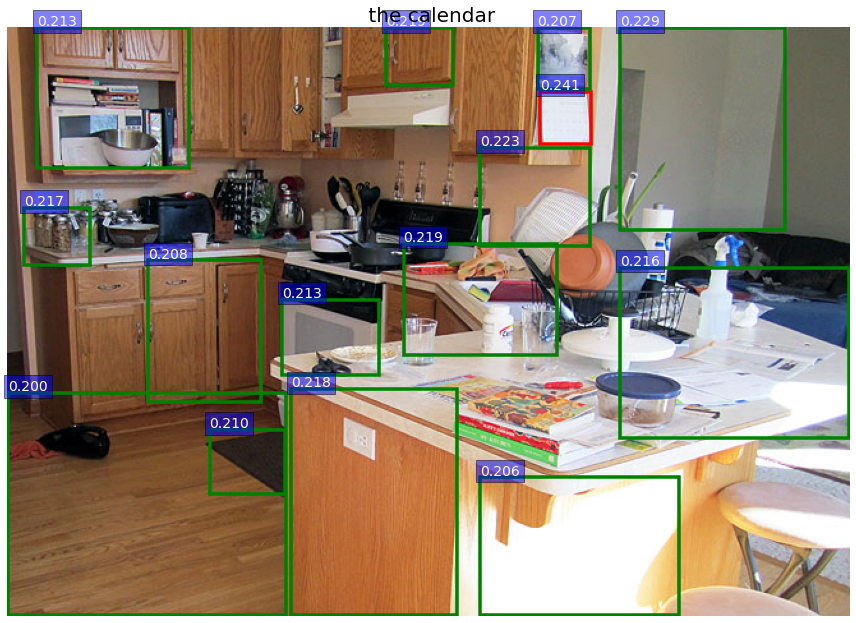

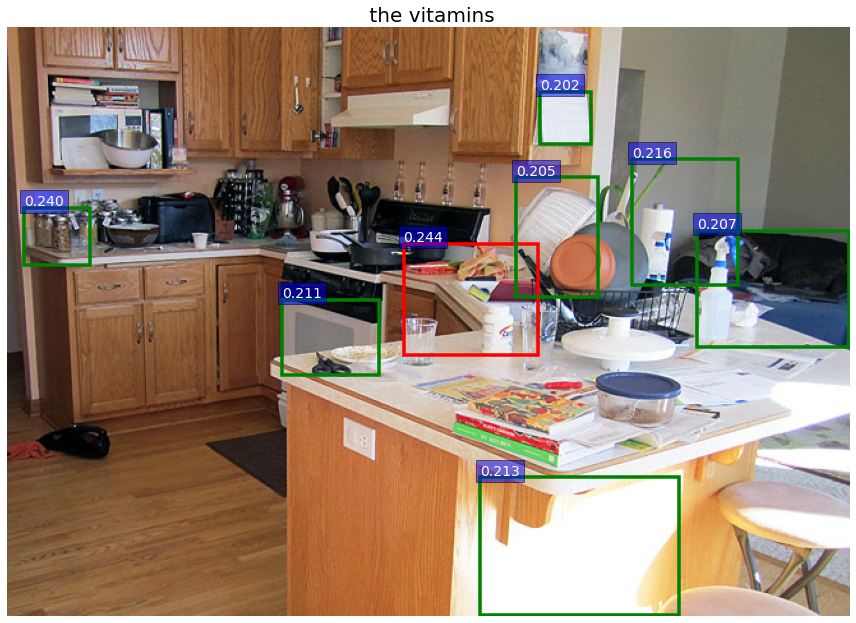

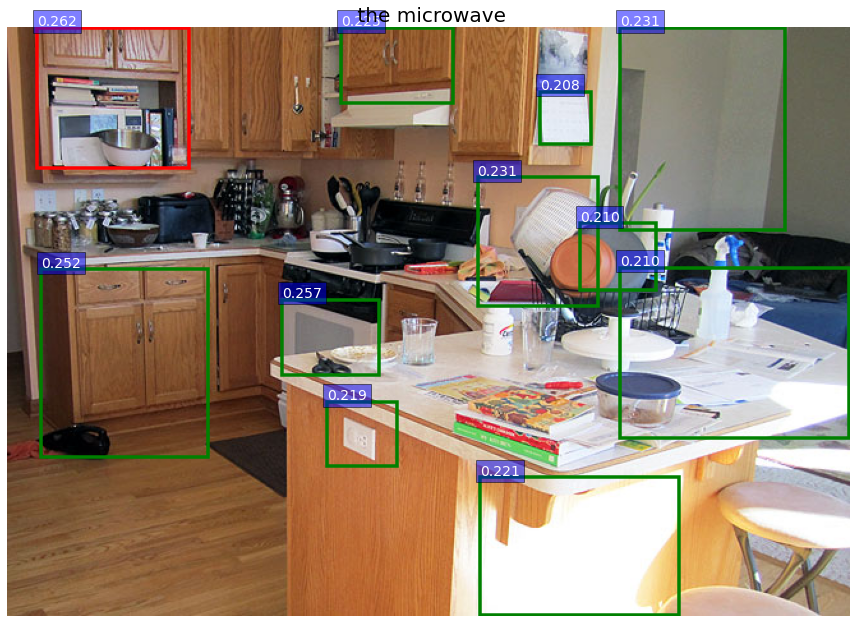

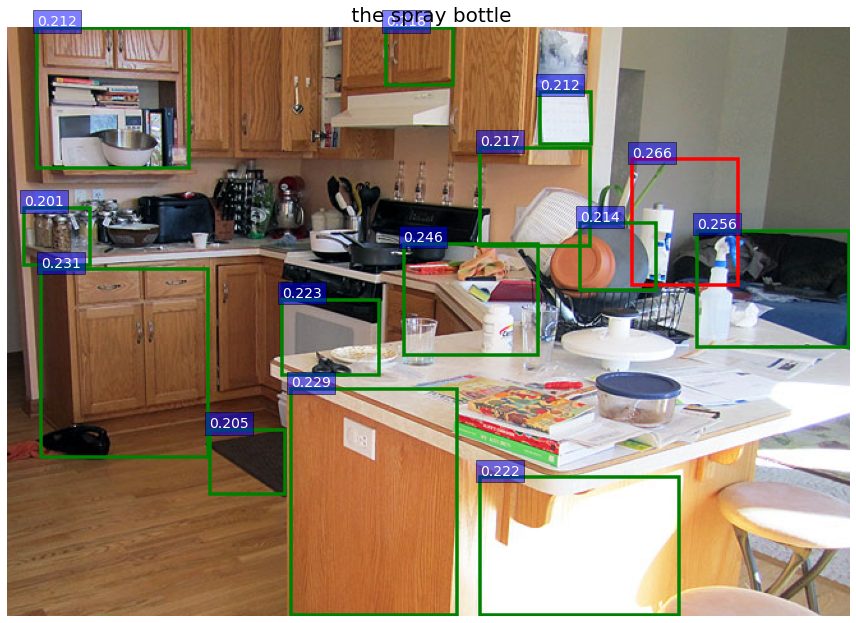

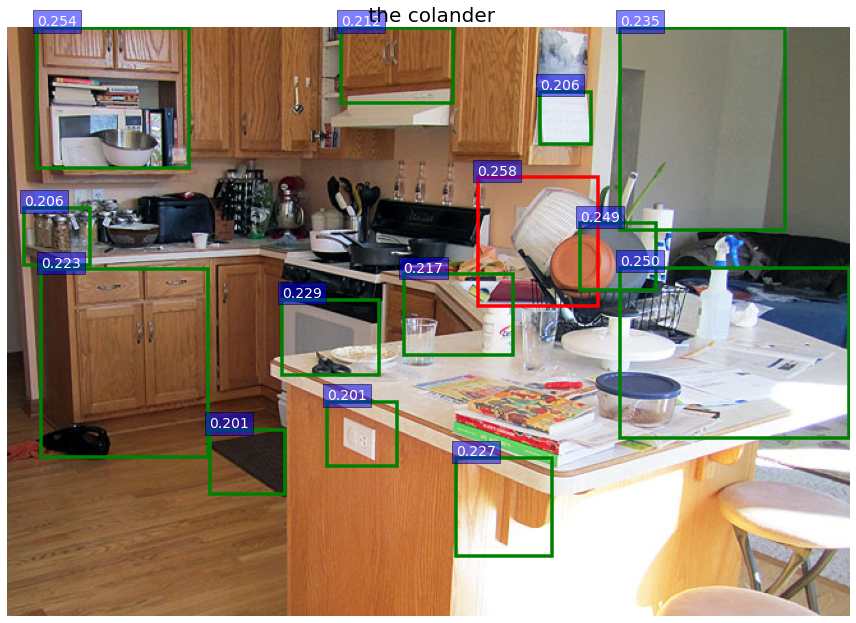

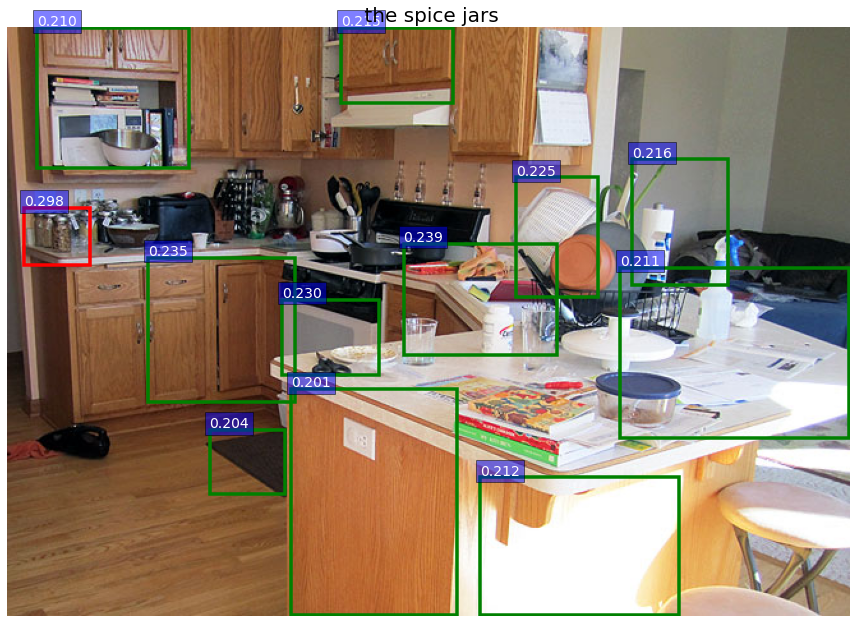

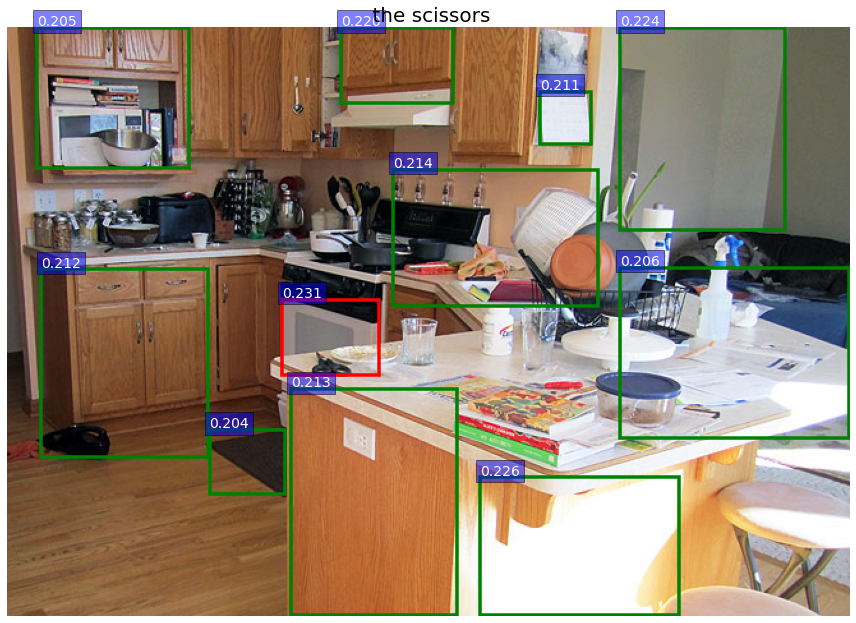

In [5]:
clip_model = "ViT-B/32"
image_caption = 'the electricity plug; the calendar; the vitamins; the microwave; the spray bottle; the colander; the spice jars; the scissors'
nms_threshold =  0.1
viz_threshold = 0.2

# Load CLIP model.
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")
model, preprocess = clip.load(clip_model, device=device, jit=False)

batch = []
for box in candidates:
    x, y, w, h = box
    patch = (img[y:y+h, x:x+w] * 255.).astype(np.uint8)
    patch = Image.fromarray(patch).convert("RGB")
    patch = preprocess(patch).unsqueeze(0)
    batch.append(patch)
batch = torch.cat(batch, dim=0).to(device)

image_caption = image_caption.split(';')
image_caption = [i for i in image_caption if i != '']
text_input = clip.tokenize(image_caption).to(device)

with torch.no_grad():
    patch_embs = model.encode_image(batch).float()
    text_embs = model.encode_text(text_input).float()
    patch_embs = patch_embs / patch_embs.norm(dim=-1, keepdim=True)
    text_embs = text_embs / text_embs.norm(dim=-1, keepdim=True)
    sim = patch_embs @ text_embs.t()
scores = sim.cpu().numpy()

for caption, score in zip(image_caption, scores.T):
    dets = []
    for box, score in zip(candidates, score):
        x, y, w, h = box
        x1 = x
        x2 = x1 + w
        y1 = y
        y2 = y1 + h
        dets.append([x1, y1, x2, y2, score])
    dets = np.asarray(dets)
    keep = nms(dets, nms_threshold)
    dets_keep = dets[keep]

    vis_detections(img, dets_keep, thresh=viz_threshold, caption=caption)

# Transfer Learning from TFHub

## Setup

In [6]:
import numpy as np
import time

import PIL.Image as Image
import matplotlib.pylab as plt

import tensorflow as tf
import tensorflow_hub as hub

import datetime

%load_ext tensorboard

## An ImageNet classifier

You'll start by using a classifier model pre-trained on the [ImageNet](https://en.wikipedia.org/wiki/ImageNet) benchmark dataset—no initial training required!

### Download the classifier

Select a <a href="https://arxiv.org/abs/1801.04381" class="external">MobileNetV2</a> pre-trained model [from TensorFlow Hub](https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/2) and wrap it as a Keras layer with [`hub.KerasLayer`](https://www.tensorflow.org/hub/api_docs/python/hub/KerasLayer). Any <a href="https://tfhub.dev/s?q=tf2&module-type=image-classification/" class="external">compatible image classifier model</a> from TensorFlow Hub will work here, including the examples provided in the drop-down below.

In [7]:
mobilenet_v2 ="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"
inception_v3 = "https://tfhub.dev/google/imagenet/inception_v3/classification/5"

classifier_model = mobilenet_v2 #@param ["mobilenet_v2", "inception_v3"] {type:"raw"}

In [8]:
IMAGE_SHAPE = (224, 224)

classifier = tf.keras.Sequential([
    hub.KerasLayer(classifier_model, input_shape=IMAGE_SHAPE+(3,))
])

### Run it on a single image

Download a single image to try the model on:

73728/61306 [====================================] - 0s 0us/step


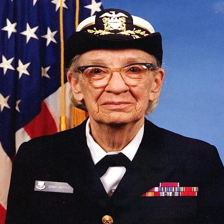

In [9]:
grace_hopper = tf.keras.utils.get_file('image.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/grace_hopper.jpg')
grace_hopper = Image.open(grace_hopper).resize(IMAGE_SHAPE)
grace_hopper

In [10]:
grace_hopper = np.array(grace_hopper)/255.0
grace_hopper.shape

(224, 224, 3)

Add a batch dimension (with `np.newaxis`) and pass the image to the model:

In [11]:
result = classifier.predict(grace_hopper[np.newaxis, ...])
result.shape

(1, 1001)

The result is a 1001-element vector of logits, rating the probability of each class for the image.

The top class ID can be found with `tf.math.argmax`:

In [12]:
predicted_class = tf.math.argmax(result[0], axis=-1)
predicted_class

<tf.Tensor: shape=(), dtype=int64, numpy=653>

### Decode the predictions

Take the `predicted_class` ID (such as `653`) and fetch the ImageNet dataset labels to decode the predictions:

In [13]:
labels_path = tf.keras.utils.get_file('ImageNetLabels.txt','https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt')
imagenet_labels = np.array(open(labels_path).read().splitlines())

24576/10484 [======================================================================] - 0s 0us/step


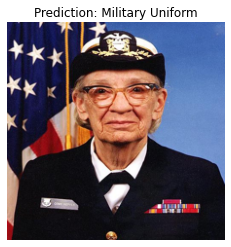

In [14]:
plt.imshow(grace_hopper)
plt.axis('off')
predicted_class_name = imagenet_labels[predicted_class]
_ = plt.title("Prediction: " + predicted_class_name.title())

## Simple transfer learning

But what if you want to create a custom classifier using your own dataset that has classes that aren't included in the original ImageNet dataset (that the pre-trained model was trained on)?

To do that, you can:

1. Select a pre-trained model from TensorFlow Hub; and
2. Retrain the top (last) layer to recognize the classes from your custom dataset.

### Dataset

In this example, you will use the TensorFlow flowers dataset:

In [15]:
data_root = tf.keras.utils.get_file(
  'flower_photos',
  'https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz',
   untar=True)

228827136/228813984 [==============================] - 1s 0us/step


First, load this data into the model using the image data off disk with `tf.keras.utils.image_dataset_from_directory`, which will generate a `tf.data.Dataset`:

In [16]:
batch_size = 32
img_height = 224
img_width = 224

train_ds = tf.keras.utils.image_dataset_from_directory(
  str(data_root),
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size
)

val_ds = tf.keras.utils.image_dataset_from_directory(
  str(data_root),
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size
)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.
Found 3670 files belonging to 5 classes.
Using 734 files for validation.


The flowers dataset has five classes:

In [17]:
class_names = np.array(train_ds.class_names)
print(class_names)

['daisy' 'dandelion' 'roses' 'sunflowers' 'tulips']


Second, because TensorFlow Hub's convention for image models is to expect float inputs in the `[0, 1]` range, use the `tf.keras.layers.Rescaling` preprocessing layer to achieve this.

Note: You could also include the `tf.keras.layers.Rescaling` layer inside the model. Refer to the [Working with preprocessing layers](https://www.tensorflow.org/guide/keras/preprocessing_layers) guide for a discussion of the tradeoffs.

In [18]:
normalization_layer = tf.keras.layers.Rescaling(1./255)
train_ds = train_ds.map(lambda x, y: (normalization_layer(x), y)) # Where x—images, y—labels.
val_ds = val_ds.map(lambda x, y: (normalization_layer(x), y)) # Where x—images, y—labels.

Third, finish the input pipeline by using buffered prefetching with `Dataset.prefetch`, so you can yield the data from disk without I/O blocking issues.

These are some of the most important `tf.data` methods you should use when loading data. Interested readers can learn more about them, as well as how to cache data to disk and other techniques, in the [Better performance with the tf.data API](https://www.tensorflow.org/guide/data_performance#prefetching) guide.

In [19]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [20]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 224, 224, 3)
(32,)


### Run the classifier on a batch of images

Now, run the classifier on an image batch:

In [21]:
result_batch = classifier.predict(train_ds)

In [22]:
predicted_class_names = imagenet_labels[tf.math.argmax(result_batch, axis=-1)]
predicted_class_names

array(['daisy', 'coral fungus', 'rapeseed', ..., 'daisy', 'daisy',
       'birdhouse'], dtype='<U30')

Check how these predictions line up with the images:

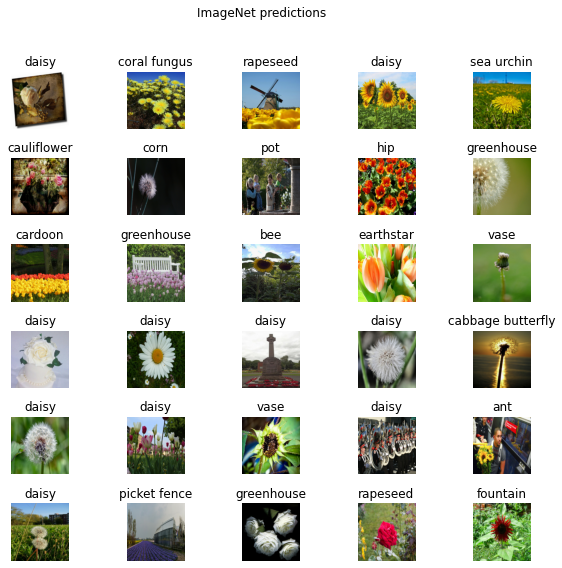

In [23]:
plt.figure(figsize=(10,9))
plt.subplots_adjust(hspace=0.5)
for n in range(30):
  plt.subplot(6,5,n+1)
  plt.imshow(image_batch[n])
  plt.title(predicted_class_names[n])
  plt.axis('off')
_ = plt.suptitle("ImageNet predictions")

Note: all images are licensed CC-BY, creators are listed in the LICENSE.txt file.

The results are far from perfect, but reasonable considering that these are not the classes the model was trained for (except for "daisy").

### Download the headless model

TensorFlow Hub also distributes models without the top classification layer. These can be used to easily perform transfer learning.

Select a <a href="https://arxiv.org/abs/1801.04381" class="external">MobileNetV2</a> pre-trained model <a href="https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4" class="external">from TensorFlow Hub</a>. Any <a href="https://tfhub.dev/s?module-type=image-feature-vector&q=tf2" class="external">compatible image feature vector model</a> from TensorFlow Hub will work here, including the examples from the drop-down menu.

In [24]:
mobilenet_v2 = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"
inception_v3 = "https://tfhub.dev/google/tf2-preview/inception_v3/feature_vector/4"

feature_extractor_model = mobilenet_v2 #@param ["mobilenet_v2", "inception_v3"] {type:"raw"}

Create the feature extractor by wrapping the pre-trained model as a Keras layer with [`hub.KerasLayer`](https://www.tensorflow.org/hub/api_docs/python/hub/KerasLayer). Use the `trainable=False` argument to freeze the variables, so that the training only modifies the new classifier layer:

In [25]:
feature_extractor_layer = hub.KerasLayer(
    feature_extractor_model,
    input_shape=(224, 224, 3),
    trainable=False)

The feature extractor returns a 1280-long vector for each image (the image batch size remains at 32 in this example):

In [26]:
feature_batch = feature_extractor_layer(image_batch)
print(feature_batch.shape)

(32, 1280)


### Attach a classification head

To complete the model, wrap the feature extractor layer in a `tf.keras.Sequential` model and add a fully-connected layer for classification:

In [27]:
num_classes = len(class_names)

model = tf.keras.Sequential([
  feature_extractor_layer,
  tf.keras.layers.Dense(num_classes)
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 5)                 6405      
                                                                 
Total params: 2,264,389
Trainable params: 6,405
Non-trainable params: 2,257,984
_________________________________________________________________


In [28]:
predictions = model(image_batch)

In [29]:
predictions.shape

TensorShape([32, 5])

### Train the model

Use `Model.compile` to configure the training process and add a `tf.keras.callbacks.TensorBoard` callback to create and store logs:

In [30]:
model.compile(
  optimizer=tf.keras.optimizers.Adam(),
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['acc'])

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1) # Enable histogram computation for every epoch.

Now use the `Model.fit` method to train the model.

To keep this example short, you'll be training for just 10 epochs. To visualize the training progress in TensorBoard later, create and store logs an a [TensorBoard callback](https://www.tensorflow.org/tensorboard/get_started#using_tensorboard_with_keras_modelfit).

In [31]:
NUM_EPOCHS = 10

history = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=NUM_EPOCHS,
                    callbacks=tensorboard_callback)

Epoch 1/10
92/92 [==============================] - 91s 944ms/step - loss: 0.7968 - acc: 0.7040 - val_loss: 0.4534 - val_acc: 0.8569
Epoch 2/10
92/92 [==============================] - 87s 946ms/step - loss: 0.3828 - acc: 0.8750 - val_loss: 0.3593 - val_acc: 0.8787
Epoch 3/10
92/92 [==============================] - 87s 945ms/step - loss: 0.2985 - acc: 0.9036 - val_loss: 0.3237 - val_acc: 0.8965
Epoch 4/10
92/92 [==============================] - 88s 963ms/step - loss: 0.2478 - acc: 0.9251 - val_loss: 0.3061 - val_acc: 0.9046
Epoch 5/10
92/92 [==============================] - 88s 959ms/step - loss: 0.2120 - acc: 0.9390 - val_loss: 0.2962 - val_acc: 0.9114
Epoch 6/10
92/92 [==============================] - 84s 910ms/step - loss: 0.1847 - acc: 0.9493 - val_loss: 0.2902 - val_acc: 0.9128
Epoch 7/10
92/92 [==============================] - 83s 909ms/step - loss: 0.1629 - acc: 0.9578 - val_loss: 0.2863 - val_acc: 0.9128
Epoch 8/10
92/92 [==============================] - 88s 957ms/step - 

Start the TensorBoard to view how the metrics change with each epoch and to track other scalar values:

In [32]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

<!-- <img class="tfo-display-only-on-site" src="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/images/images/tensorboard_transfer_learning_with_hub.png?raw=1"/> -->

### Check the predictions

Obtain the ordered list of class names from the model predictions:

In [33]:
predicted_batch = model.predict(image_batch)
predicted_id = tf.math.argmax(predicted_batch, axis=-1)
predicted_label_batch = class_names[predicted_id]
print(predicted_label_batch)

['roses' 'dandelion' 'tulips' 'sunflowers' 'dandelion' 'roses' 'dandelion'
 'roses' 'tulips' 'dandelion' 'tulips' 'tulips' 'sunflowers' 'tulips'
 'dandelion' 'roses' 'daisy' 'tulips' 'dandelion' 'dandelion' 'dandelion'
 'tulips' 'sunflowers' 'roses' 'sunflowers' 'dandelion' 'tulips' 'roses'
 'roses' 'sunflowers' 'tulips' 'sunflowers']


Plot the model predictions:

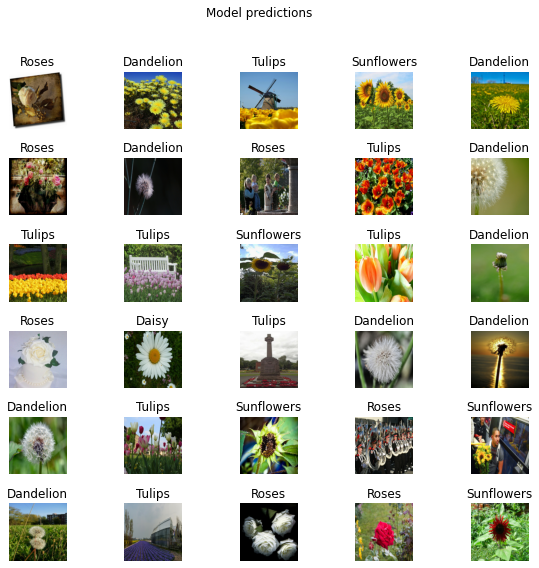

In [34]:
plt.figure(figsize=(10,9))
plt.subplots_adjust(hspace=0.5)

for n in range(30):
  plt.subplot(6,5,n+1)
  plt.imshow(image_batch[n])
  plt.title(predicted_label_batch[n].title())
  plt.axis('off')
_ = plt.suptitle("Model predictions")

## Export and reload your model

Now that you've trained the model, export it as a SavedModel for reusing it later.

In [35]:
t = time.time()

export_path = "/tmp/saved_models/{}".format(int(t))
model.save(export_path)

export_path

INFO:tensorflow:Assets written to: /tmp/saved_models/1651964303/assets


INFO:tensorflow:Assets written to: /tmp/saved_models/1651964303/assets


'/tmp/saved_models/1651964303'

Confirm that you can reload the SavedModel and that the model is able to output the same results:

In [36]:
reloaded = tf.keras.models.load_model(export_path)

In [37]:
result_batch = model.predict(image_batch)
reloaded_result_batch = reloaded.predict(image_batch)

In [38]:
abs(reloaded_result_batch - result_batch).max()

0.0

In [39]:
reloaded_predicted_id = tf.math.argmax(reloaded_result_batch, axis=-1)
reloaded_predicted_label_batch = class_names[reloaded_predicted_id]
print(reloaded_predicted_label_batch)

['roses' 'dandelion' 'tulips' 'sunflowers' 'dandelion' 'roses' 'dandelion'
 'roses' 'tulips' 'dandelion' 'tulips' 'tulips' 'sunflowers' 'tulips'
 'dandelion' 'roses' 'daisy' 'tulips' 'dandelion' 'dandelion' 'dandelion'
 'tulips' 'sunflowers' 'roses' 'sunflowers' 'dandelion' 'tulips' 'roses'
 'roses' 'sunflowers' 'tulips' 'sunflowers']


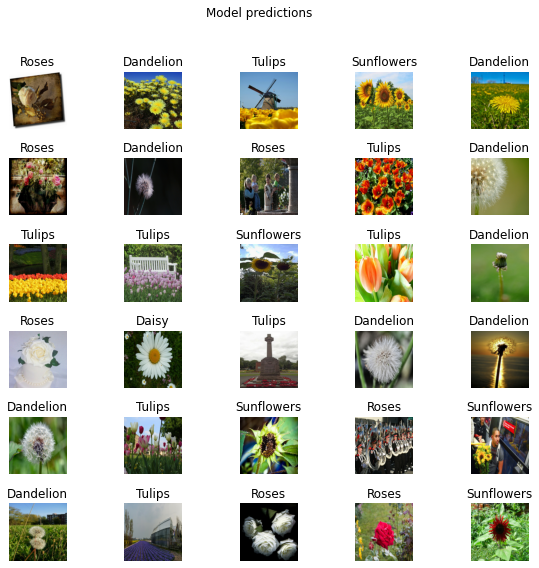

In [40]:
plt.figure(figsize=(10,9))
plt.subplots_adjust(hspace=0.5)
for n in range(30):
  plt.subplot(6,5,n+1)
  plt.imshow(image_batch[n])
  plt.title(reloaded_predicted_label_batch[n].title())
  plt.axis('off')
_ = plt.suptitle("Model predictions")

# Reference

1. [CLIP Zero-shot Detector](https://colab.research.google.com/github/kevinzakka/clip_playground/blob/main/CLIP_Zero_shot_Detector.ipynb)

2. [Transfer learning with TensorFlow Hub](https://www.tensorflow.org/tutorials/images/transfer_learning_with_hub)